!pip install pandas-datareader

!pip install PyPortfolioOpt

!pip install plotly

!pip install seaborn

In [1]:
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

from pandas_datareader.data import DataReader
import yfinance as yf
from pypfopt.discrete_allocation import DiscreteAllocation, get_latest_prices
from pypfopt import EfficientFrontier
from pypfopt import risk_models
from pypfopt import expected_returns
from pypfopt import plotting
import copy
import numpy as np
import pandas as pd

## Get Stock Prices using pandas_datareader Library
Let's get some data for the stock tickers that we want to include in our portfolio. The pandas-datareader library provides a method to pull stock price data from the web and store it in a DataFrame. 

If you do not pass in the start and end dates, stock prices will be given for the full date range available. Note that the date range may be different for different stocks depending on when they were listed.

In [2]:
start_date = '2018-05-18' 
end_date = '2023-12-27'

stocks_df = pd.read_csv('res.csv', index_col=False)
stocks_df['Date'] = pd.to_datetime(stocks_df['Date'], format='%Y-%m-%d')
stocks_df = stocks_df.set_index('Date')
tickers = stocks_df.columns.tolist()
print(len(tickers))
stocks_df.head()

30


,HDB,MBB,JVC,ACB,VND,PVT,AAA,TPB,HAH,VHM,...,VJC,MSN,SLS,RAL,DBC,PTB,OGC,KPF,DRC,DAH
Date,,,,,,,,,,,,,,,,,,,,,
2018-05-18,15172.8,12206.9,3470.0,14094.2,20741.3,18300.0,15065.7,14054.7,14200.0,114700.0,...,158333.0,92500.0,64100.0,113900.0,6923.0,63526.0,2300.0,18862.8,20000.0,4564.0
2018-05-21,15378.6,11924.9,3470.0,13896.6,20042.2,18000.0,14869.6,13983.7,14200.0,114700.0,...,153333.0,89000.0,63000.0,113900.0,7205.0,63857.0,2310.0,19349.6,20000.0,4564.0
2018-05-22,14592.9,11602.6,3350.0,13534.3,18643.9,17800.0,14398.8,13865.4,13900.0,71097.0,...,147417.0,85000.0,62000.0,113800.0,7049.0,62798.0,2300.0,19410.4,19950.0,4392.0
2018-05-23,14106.4,11804.1,3430.0,13666.1,19948.9,18500.0,15379.6,13912.8,13950.0,66346.0,...,148333.0,85000.0,63900.0,115000.0,7174.0,62798.0,2320.0,19471.3,21300.0,4501.0
2018-05-24,13283.2,11783.9,3350.0,13501.4,19110.0,18150.0,16007.4,13865.4,14000.0,68872.0,...,142917.0,84500.0,64500.0,115000.0,7143.0,61541.0,2290.0,19471.3,20200.0,4483.0


## Plot Individual Stock Prices
The graph is plotted with plotly library. It is an interactive graph.

/home/son/anaconda3/lib/python3.11/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  v = v.dt.to_pydatetime()


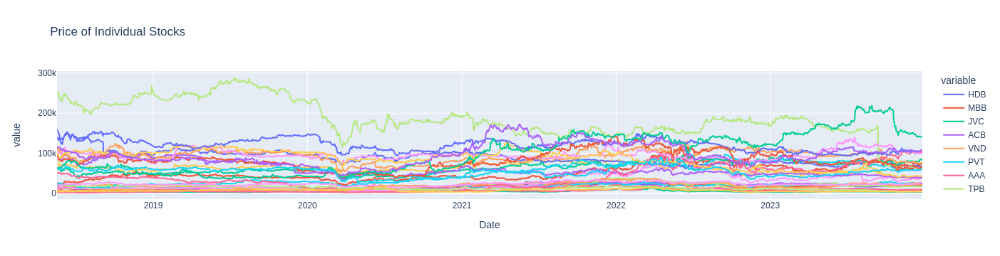

In [3]:
fig_price = px.line(stocks_df, title='Price of Individual Stocks')
fig_price.show()

As seen above, Amazon seems to dominate the scale of the graph as the absolute price of the stock is very high. The graphs of all other stocks are flattened out. A graph like this is not very useful to compare the relative performance of the stocks. To address this, let's see how we can better measure the performance of a stock by exploring the concepts of daily returns and volatility.

## Daily Returns
The daily returns of a stock is the fractional gain (or loss) on a given day relative to the previous day, it is given by (current day's close price - previous day's close price) / (previous day's close price). As it is a relative value, it provides a fairer comparison between stock returns regardless of absolute stock prices. The pct_change() method can be used to get the daily returns efficiently.

In [4]:
daily_returns = stocks_df.pct_change().dropna()
daily_returns.head()

,HDB,MBB,JVC,ACB,VND,PVT,AAA,TPB,HAH,VHM,...,VJC,MSN,SLS,RAL,DBC,PTB,OGC,KPF,DRC,DAH
Date,,,,,,,,,,,,,,,,,,,,,
2018-05-21,0.013564,-0.023102,0.000000,-0.014020,-0.033706,-0.016393,-0.013016,-0.005052,0.000000,0.000000,...,-0.031579,-0.037838,-0.017161,0.000000,0.040734,0.005210,0.004348,0.025807,0.000000,0.000000
2018-05-22,-0.051090,-0.027027,-0.034582,-0.026071,-0.069768,-0.011111,-0.031662,-0.008460,-0.021127,-0.380148,...,-0.038583,-0.044944,-0.015873,-0.000878,-0.021652,-0.016584,-0.004329,0.003142,-0.002500,-0.037686
2018-05-23,-0.033338,0.017367,0.023881,0.009738,0.069996,0.039326,0.068117,0.003419,0.003597,-0.066824,...,0.006214,0.000000,0.030645,0.010545,0.017733,0.000000,0.008696,0.003137,0.067669,0.024818
2018-05-24,-0.058356,-0.001711,-0.023324,-0.012052,-0.042052,-0.018919,0.040820,-0.003407,0.003584,0.038073,...,-0.036512,-0.005882,0.009390,0.000000,-0.004321,-0.020017,-0.012931,0.000000,-0.051643,-0.003999
2018-05-25,-0.007039,-0.035896,-0.029851,-0.024390,-0.063417,-0.011019,0.014706,-0.010234,-0.010714,0.026194,...,-0.069971,-0.011834,0.006202,0.000000,-0.043959,0.010757,-0.017467,-0.003128,-0.014851,0.002008


Let's plot out the daily returns of 2 of the stocks, Boeing (BA) and Visa (V), throughout the whole time period. We see that they tend to fluctuate gently around 0. Notably, the fluctuations are much greater during a period of high volatility (i.e. during the Covid crash in March 2020).

/home/son/anaconda3/lib/python3.11/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



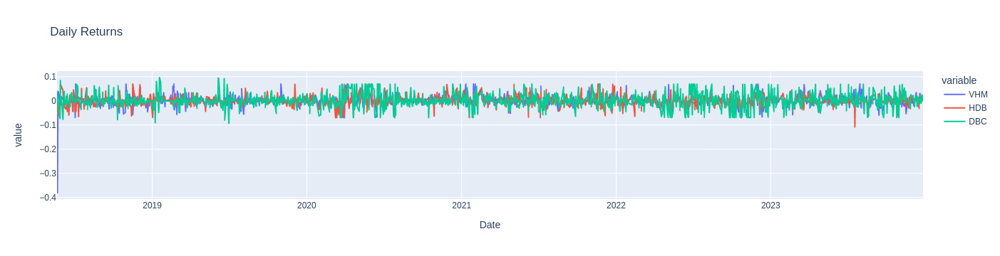

In [5]:
fig = px.line(daily_returns[['VHM', 'HDB', 'DBC']], title='Daily Returns')
fig.show()

## Volatility

#### Daily Volatility

Daily Volatility is the average difference between the return on a given day and the average return over the time period. Mathematically, it is just the standard deviation of the daily returns. Volatility is one of the measures of risk in that highly volatile investments can carry greater risk.

In [6]:
daily_returns.std()

HDB    0.021169
MBB    0.020620
JVC    0.032946
ACB    0.020056
VND    0.034992
PVT    0.025621
AAA    0.025244
TPB    0.022621
HAH    0.040574
VHM    0.022766
VNM    0.016854
VHC    0.026342
PNJ    0.020249
BVH    0.021933
GAS    0.022493
BCM    0.027911
FRT    0.030074
SAB    0.021995
DHG    0.017138
VIC    0.019326
VJC    0.016331
MSN    0.022932
SLS    0.026324
RAL    0.021718
DBC    0.030073
PTB    0.022737
OGC    0.033777
KPF    0.047298
DRC    0.023644
DAH    0.032486
dtype: float64

Here we see that BA has a slightly higher volatility, compared to that of V. When we compare the density plots of their daily returns, we can see that V has a narrower curve with a higher peak, while BA has a wider curve indicating higher standard deviation and hence volatility.

/home/son/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



(-0.1, 0.1)

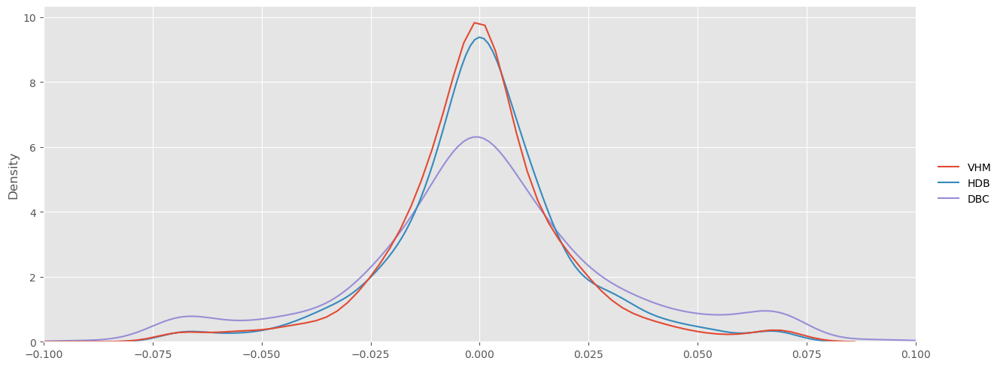

In [7]:
sns.displot(data=daily_returns[['VHM', 'HDB', 'DBC']], kind = 'kde', aspect = 2.5)
plt.xlim(-0.1, 0.1)

#### Annual Volatility

For completeness, the Annual Volatility is a more common measure can be calculated simply by multiply the daily volatility by the square root of the number of trading days in a year i.e. 252. 

## Plot Individual Cumulative Returns
The cumulative returns of the stock can be easily calculated by adding one to the daily returns and taking the cumulative product over the whole period. Here we plot the cumulative returns of stocks starting with an initial investment of 100 (how much would investing 100 at the start in each individual stock get you over the time period?) This is a fair comparison for the performance of the stocks.

/home/son/anaconda3/lib/python3.11/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



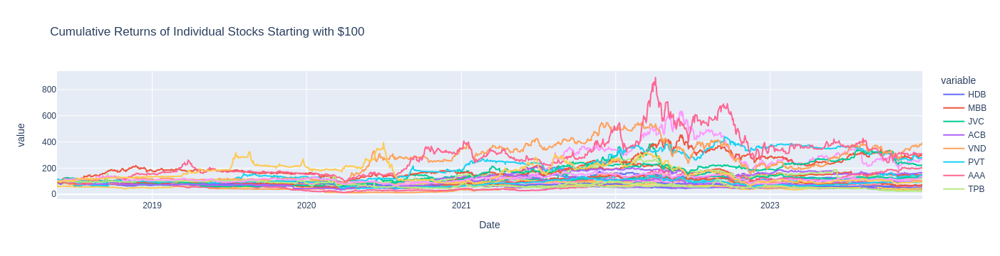

In [8]:
def plot_cum_returns(data, title):    
    daily_cum_returns = (1 + daily_returns).cumprod()*100
    fig = px.line(daily_cum_returns, title=title)
    return fig
    
fig_cum_returns = plot_cum_returns(stocks_df, 'Cumulative Returns of Individual Stocks Starting with $100')
fig_cum_returns.show()

## Plot Correlation Matrix between Stocks
The correlation matrix gives us the correlation coefficients between every pair of stocks. Correlation coefficients are indicators of the strength of the linear relationship between two different variables. It is a value from 0 to 1, with 1 indicating the strongest relationship. If it is a negative value, then the two variables are inversely related. 

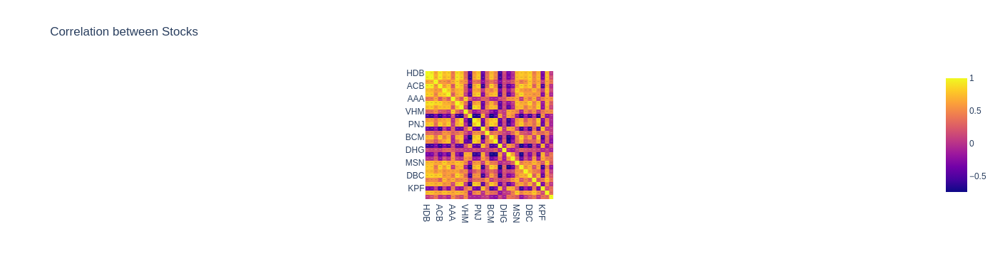

In [9]:
corr_df = stocks_df.corr().round(2) # round to 2 decimal places
fig_corr = px.imshow(corr_df, text_auto=True, title = 'Correlation between Stocks')
fig_corr.show()


In general (though not always), stock prices tend to move together (increase in bull market, decrease in bear market), hence the correlation would most likely be positive as shown below. Also notice how Boeing (BA) is weakly correlated to other stocks during this time period. This may be because it is in a very different industry, or because of the bad news that has been hitting it over the recent years. And notice how Mastercard (MA) and Visa (V) are almost perfectly correlated.

## Get Expected Returns and Covariance Matrix
Similarly, the covariance matrix measures whether stocks move in the same direction (a positive covariance) or in opposite directions (a negative covariance). 
It is used to calculate the volatility of the whole portfolio of stocks, which in turn is used by portfolio managers to quantify its risk. PyPortfolioOpt makes it easy to get this matrix, and also the mean annual return of each stocks. We need these as inputs to find our optimized portfolio later.

In [10]:
stocks_df

,HDB,MBB,JVC,ACB,VND,PVT,AAA,TPB,HAH,VHM,...,VJC,MSN,SLS,RAL,DBC,PTB,OGC,KPF,DRC,DAH
Date,,,,,,,,,,,,,,,,,,,,,
2018-05-18,15172.8,12206.9,3470.0,14094.2,20741.3,18300.0,15065.7,14054.7,14200.0,114700.0,...,158333.0,92500.0,64100.0,113900.0,6923.0,63526.0,2300.0,18862.8,20000.0,4564.0
2018-05-21,15378.6,11924.9,3470.0,13896.6,20042.2,18000.0,14869.6,13983.7,14200.0,114700.0,...,153333.0,89000.0,63000.0,113900.0,7205.0,63857.0,2310.0,19349.6,20000.0,4564.0
2018-05-22,14592.9,11602.6,3350.0,13534.3,18643.9,17800.0,14398.8,13865.4,13900.0,71097.0,...,147417.0,85000.0,62000.0,113800.0,7049.0,62798.0,2300.0,19410.4,19950.0,4392.0
2018-05-23,14106.4,11804.1,3430.0,13666.1,19948.9,18500.0,15379.6,13912.8,13950.0,66346.0,...,148333.0,85000.0,63900.0,115000.0,7174.0,62798.0,2320.0,19471.3,21300.0,4501.0
2018-05-24,13283.2,11783.9,3350.0,13501.4,19110.0,18150.0,16007.4,13865.4,14000.0,68872.0,...,142917.0,84500.0,64500.0,115000.0,7143.0,61541.0,2290.0,19471.3,20200.0,4483.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-21,18750.0,18150.0,3330.0,23250.0,21750.0,26500.0,9240.0,16900.0,37450.0,40200.0,...,105300.0,63700.0,141400.0,105500.0,26450.0,58200.0,7110.0,5250.0,25850.0,4370.0
2023-12-22,18950.0,18300.0,3360.0,23200.0,21500.0,26600.0,9240.0,16900.0,37400.0,40300.0,...,106200.0,63000.0,141000.0,106600.0,26200.0,58500.0,7080.0,5230.0,26900.0,4350.0
2023-12-25,19150.0,18400.0,3360.0,23350.0,21700.0,27300.0,9330.0,17050.0,38850.0,41200.0,...,107800.0,66400.0,141200.0,108500.0,26300.0,60400.0,7090.0,5240.0,27250.0,4350.0


In [11]:
# Calculate expected returns and sample covariance matrix
mu = expected_returns.mean_historical_return(stocks_df)
S = risk_models.sample_cov(stocks_df)

print(mu)

HDB    0.044035
MBB    0.076264
JVC   -0.003643
ACB    0.094212
VND    0.010608
PVT    0.069281
AAA   -0.081015
TPB    0.038446
HAH    0.191387
VHM   -0.165034
VNM   -0.122324
VHC    0.218639
PNJ    0.059722
BVH   -0.148438
GAS   -0.070845
BCM    0.204028
FRT    0.133582
SAB   -0.222096
DHG   -0.003506
VIC   -0.140680
VJC   -0.066380
MSN   -0.056127
SLS    0.153539
RAL   -0.009481
DBC    0.278145
PTB   -0.013151
OGC    0.222468
KPF   -0.202034
DRC    0.055221
DAH   -0.008157
dtype: float64


## Optimize portfolio for max Sharpe ratio plot it out with efficient frontier curve
The efficient frontier is the set of optimal portfolios that offer the highest expected return for a defined level of risk (volatility) or the lowest risk (volatility) for a given level of expected return. It is represented by a line on a Return vs Volatility graph. The max Sharpe ratio portfolio lies on the efficient frontier. 

To represent everything visually, the code below (from documentation) generates 1000 portfolios of our stocks with random weights and plot out their returns and volatility. The efficient frontier and the max Sharpe ratio portfolio is also plotted on the graph.

/home/son/anaconda3/lib/python3.11/site-packages/cvxpy/reductions/solvers/solving_chain.py:336: FutureWarning:


    Your problem is being solved with the ECOS solver by default. Starting in 
    CVXPY 1.5.0, Clarabel will be used as the default solver instead. To continue 
    using ECOS, specify the ECOS solver explicitly using the ``solver=cp.ECOS`` 
    argument to the ``problem.solve`` method.
    



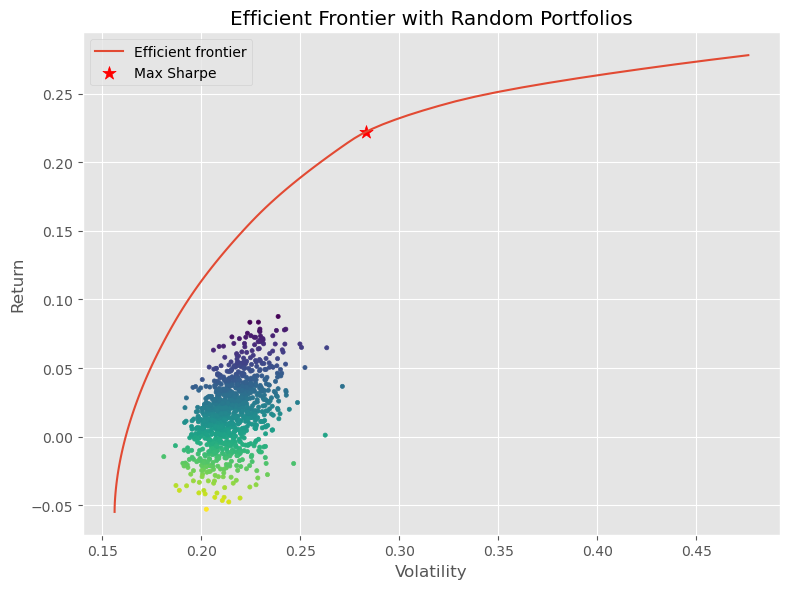

In [12]:
def plot_efficient_frontier_and_max_sharpe(mu, S):  
    # Optimize portfolio for maximal Sharpe ratio 
    ef = EfficientFrontier(mu, S)

    fig, ax = plt.subplots(figsize=(8,6))
    ef_max_sharpe = copy.deepcopy(ef)
    plotting.plot_efficient_frontier(ef, ax=ax, show_assets=False)

    # Find the max sharpe portfolio
    ef_max_sharpe.max_sharpe(risk_free_rate=0.02)
    ret_tangent, std_tangent, _ = ef_max_sharpe.portfolio_performance()
    ax.scatter(std_tangent, ret_tangent, marker="*", s=100, c="r", label="Max Sharpe")

    # Generate random portfolios
    n_samples = 1000
    w = np.random.dirichlet(np.ones(ef.n_assets), n_samples)
    rets = w.dot(ef.expected_returns)
    stds = np.sqrt(np.diag(w @ ef.cov_matrix @ w.T))
    sharpes = rets / stds
    ax.scatter(stds, rets, marker=".", c=sharpes, cmap="viridis_r")

    # Output
    ax.set_title("Efficient Frontier with Random Portfolios")
    ax.legend()
    plt.tight_layout()
    plt.show()
    
plot_efficient_frontier_and_max_sharpe(mu, S)

Hopefully the graph gives you a better idea of what the efficient frontier is. In the graph above, we see that the efficient frontier is like a boundary. i.e. It is not possible for portfolios to lie above the frontier (else we would have portfolios with the same volatility as those on the frontier but with higher expected returns). It is also not possible for portfolios to lie at the left of the frontier (else we would have portfolios with the same expected returns as those on the frontier but with lower volatility).

## Get Weights for Optimized Portfolio

In [13]:
ef = EfficientFrontier(mu, S)
ef.max_sharpe(risk_free_rate=0.05)
weights = ef.clean_weights()
print(weights)

OrderedDict([('HDB', 0.0), ('MBB', 0.0), ('JVC', 0.0), ('ACB', 0.0), ('VND', 0.0), ('PVT', 0.0), ('AAA', 0.0), ('TPB', 0.0), ('HAH', 0.01382), ('VHM', 0.0), ('VNM', 0.0), ('VHC', 0.21197), ('PNJ', 0.0), ('BVH', 0.0), ('GAS', 0.0), ('BCM', 0.21401), ('FRT', 0.0), ('SAB', 0.0), ('DHG', 0.0), ('VIC', 0.0), ('VJC', 0.0), ('MSN', 0.0), ('SLS', 0.1288), ('RAL', 0.0), ('DBC', 0.31769), ('PTB', 0.0), ('OGC', 0.11371), ('KPF', 0.0), ('DRC', 0.0), ('DAH', 0.0)])


In [28]:
weights_df = pd.DataFrame.from_dict(weights, orient = 'index')
weights_df.columns = ['weights']
weights_df

weights1 = weights_df[weights_df['weights'] > 0]
weights1

,weights
HAH,0.01382
VHC,0.21197
BCM,0.21401
SLS,0.12880
DBC,0.31769
OGC,0.11371


([<matplotlib.patches.Wedge at 0x7fa25c157850>,
 [Text(1.0989634021629555, 0.04774348862852585, 'HAH'),
  Text(0.8027874783926505, 0.7520187926747375, 'VHC'),
  Text(-0.5467746547080508, 0.9544828322022832, 'BCM'),
  Text(-1.0996170018827789, -0.029024974941053633, 'SLS'),
  Text(-0.15536759167907613, -1.0889724107872725, 'DBC'),
  Text(1.030555794798015, -0.3846488708006712, 'OGC')])

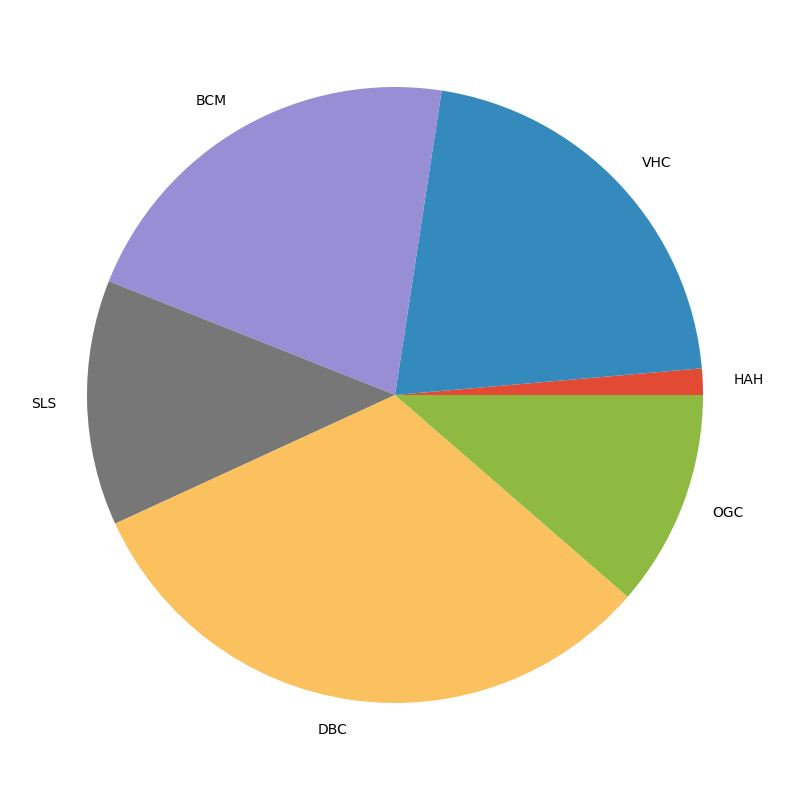

In [29]:
plt.figure(figsize=(10,10))
plt.pie(weights1['weights'], labels=weights1.index)

In [30]:
weights1.reset_index()

,index,weights
0,HAH,0.01382
1,VHC,0.21197
2,BCM,0.21401
3,SLS,0.12880
4,DBC,0.31769
5,OGC,0.11371


In [31]:
weights1 = weights1.reset_index().rename(columns={'index':'ticker', 'weights':'weight'})
weights1.to_csv('max_sharpe_weights.csv', index=False)

Notice how certain weights tend to dominate by high performing stocks (high returns with relatively ok volatility), while some weights tend to be 0. One of the weakness of the max Sharpe portfolio optimization approach is that the portfolio may not be as diversified (across types of stocks or industries) as we want it to be. Also, as cliche as it may sound, past performance is not indicative of future results. We are obtaining the expected returns and volatility based on the movement of stock prices in the past, the future returns/volatility may very well differ.

## Expected Annual Return, Annual Volatility and Sharpe Ratio for Optimized Portfolio

In [16]:
expected_annual_return, annual_volatility, sharpe_ratio = ef.portfolio_performance()

print('Expected annual return: {}%'.format((expected_annual_return*100).round(2)))
print('Annual volatility: {}%'.format((annual_volatility*100).round(2)))
print('Sharpe ratio: {}'.format(sharpe_ratio.round(2)))

Expected annual return: 22.61%
Annual volatility: 28.92%
Sharpe ratio: 0.61


/home/son/anaconda3/lib/python3.11/site-packages/pypfopt/efficient_frontier/efficient_frontier.py:441: UserWarning:

The risk_free_rate provided to portfolio_performance is different to the one used by max_sharpe. Using the previous value.



## Generate Portfolio with Optimized Weights

In [128]:
stocks_df['Optimized Portfolio'] = 0

for ticker, weight in weights.items():
    stocks_df['Optimized Portfolio'] += stocks_df[ticker]*weight

stocks_df.head()

,HDB,MBB,JVC,ACB,VND,PVT,AAA,TPB,HAH,VHM,...,MSN,SLS,RAL,DBC,PTB,OGC,KPF,DRC,DAH,Optimized Portfolio
Date,,,,,,,,,,,,,,,,,,,,,
2018-05-18,15172.8,12206.9,3470.0,14094.2,20741.3,18300.0,15065.7,14054.7,14200.0,114700.0,...,92500.0,64100.0,113900.0,6923.0,63526.0,2300.0,18862.8,20000.0,4564.0,20878.70887
2018-05-21,15378.6,11924.9,3470.0,13896.6,20042.2,18000.0,14869.6,13983.7,14200.0,114700.0,...,89000.0,63000.0,113900.0,7205.0,63857.0,2310.0,19349.6,20000.0,4564.0,20856.17447
2018-05-22,14592.9,11602.6,3350.0,13534.3,18643.9,17800.0,14398.8,13865.4,13900.0,71097.0,...,85000.0,62000.0,113800.0,7049.0,62798.0,2300.0,19410.4,19950.0,4392.0,20469.25250
2018-05-23,14106.4,11804.1,3430.0,13666.1,19948.9,18500.0,15379.6,13912.8,13950.0,66346.0,...,85000.0,63900.0,115000.0,7174.0,62798.0,2320.0,19471.3,21300.0,4501.0,21546.38219
2018-05-24,13283.2,11783.9,3350.0,13501.4,19110.0,18150.0,16007.4,13865.4,14000.0,68872.0,...,84500.0,64500.0,115000.0,7143.0,61541.0,2290.0,19471.3,20200.0,4483.0,21702.45257


## Plot Cumulative Returns of Optimized Portfolio

<Axes: xlabel='Date'>

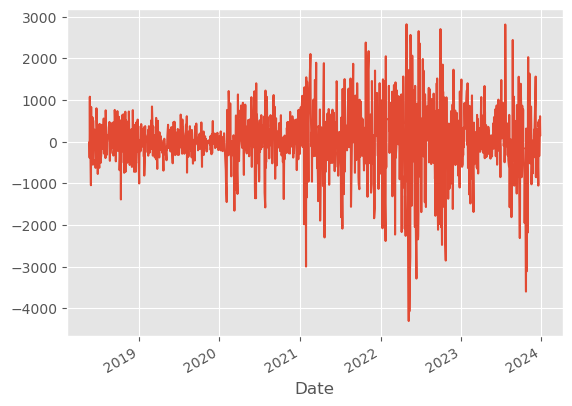

In [129]:
stocks_df['Optimized Portfolio'].diff().plot()

/home/son/anaconda3/lib/python3.11/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



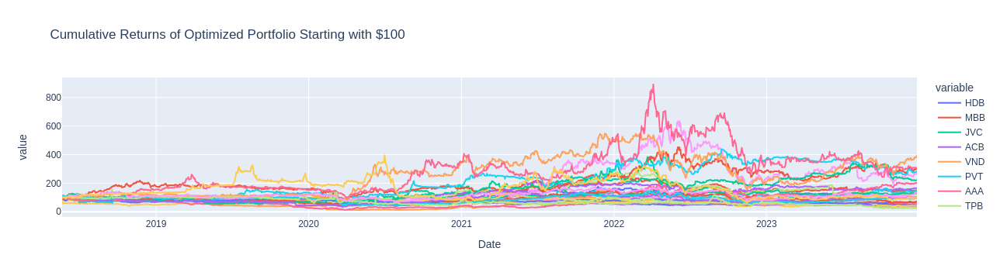

In [130]:
fig_cum_returns_optimized = plot_cum_returns(stocks_df['Optimized Portfolio'], 'Cumulative Returns of Optimized Portfolio Starting with $100')
fig_cum_returns_optimized.show()